<a href="https://colab.research.google.com/github/annachrome/Classifying_Flowers/blob/main/6_0_Flowers_ResNet_50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Imports**

In [68]:
# @title Default title text
# Mount Google Drive to access files on Drive
from google.colab import drive
drive.mount('/content/drive')

# Import necessary Python packages
import os
import csv
import scipy.io
import random
from tqdm.notebook import tqdm
import time

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image, ImageOps

import albumentations as A
from albumentations.pytorch import ToTensorV2
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_fscore_support

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
from torchvision.models import resnet50, ResNet50_Weights

import tensorflow_datasets as tfds
import tensorflow as tf

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Tasks:
1. Do a thorough Exploratory Data Analysis of the Flowers dataset
- Some Class imbalance: Data Augmentation, use classification report metrics like precision, recall instead of relying purely on accuracy
2. Use a pre-trained ResNet 50 and train on the dataset.
3. Report the final performance metrics for your approach.
4. Suggest ways in which you can improve the model.
    - Grayscale augmentation: help the model learn features that are not color-dependent.
    - Color Jittering: Introduce variations in brightness, contrast, and saturation to reduce the model’s sensitivity to color.

# **Variables and Hyperparameters to tweak**

In [69]:
# File/Directory paths
root_dir = '/content/drive/MyDrive/Flowers/Dataset/'
version = '6'

IMAGE_DIR = root_dir + 'Dataset_images/'
CHECKPOINT_PATH = root_dir + f'model_checkpoint_{version}.pt'
BEST_PARAMS_PATH = root_dir + f'best_params_{version}.pt'
CONF_MATRIX_PNG = root_dir + f'confusion_matrix_{version}.png'
CONF_MATRIX_CSV = root_dir + f'confusion_matrix_{version}.csv'
VAL_REPORT_PATH = root_dir + f'final_report_{version}.txt'
ALL_LABELS_PATH = root_dir + f'all_labels_{version}.csv'
ALL_PREDS_PATH = root_dir + f'all_preds_{version}.csv'

# Hyperparameters
INPUT_SIZE = 224
P_CUTMIX = 0.5 # Probability of applying cutmix augmentation to a batch of data
ALPHA_CUTMIX = 0.8 # Alpha for CutMix augmentation function
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE = 1e-4
NUM_EPOCHS = 20
BATCH_SIZE = 8
NUM_WORKERS = 2
PIN_MEMORY = True
LOAD_MODEL = True

# **Utils: Dataset**

In [70]:
class FlowersDataset(Dataset):
    '''
    Dataset class for Flowers dataset including resizing and transforms

    Attributes:
        mat_filepath (str): path to matlab file with image labels
        df (Pandas DataFrame): contains full image path, label, width and height
        input_size (int): desired height and width (x,x) of inputs for model
        transform (callable, optional): pre-processing transforms to be applied
    '''

    def __init__(self, df, input_size=224, transform=None):
        self.df = df
        self.input_size = input_size
        self.transform = transform

    def __len__(self):
        return len(self.df.index)

    def __getitem__(self, idx):
        '''
        For a given index, returns the corresponding image and label pair
        Note: idx 703 refers to the file 'image_00704.jpg'
        '''

        # image indices start from 1 instead of 0

        #image_path = self.df.loc[self.df['img_idx']==idx+1, 'img_path'].values[0]
        image_path = self.df.iloc[idx]['img_path']

        image = Image.open(image_path)

        image = self.resize_and_pad_image(image, new_size=self.input_size)

        image = np.array(image)  # Convert PIL Image to numpy array

        if self.transform:
            augmented = self.transform(image=image)
            image = augmented['image']

        #label = self.df.loc[self.df['img_idx']==idx+1, 'label'].values[0]
        original_label = self.df.iloc[idx]['label']

        # need labels to be from zero-indexed: 0 to 101 instead of 1 to 102
        # rename label 102 as label 0
        if original_label == 102:
            label = 0
        else:
            label = original_label

        return image, label


    def resize_and_pad_image(self, img, new_size):
        '''
        Resizes and pads image while maintaining aspect ratio
        '''
        # Calculate aspect ratio
        w, h = img.size
        aspect_ratio = w / h

        # Resize image
        if w > h:
            new_w = new_size
            new_h = int(new_size / aspect_ratio)
        else:
            new_h = new_size
            new_w = int(new_size * aspect_ratio)

        resized_img = img.resize((new_w, new_h))

        # Calculate padding values
        delta_w = new_size - new_w
        delta_h = new_size - new_h
        padding = (delta_w//2, delta_h//2,
                   delta_w-(delta_w//2), delta_h-(delta_h//2))

        # Pad the resized image
        padded_img = ImageOps.expand(resized_img, padding)

        return padded_img


# **Utils: Image Plotting (Preprocessed, Predictions,...)**

In [71]:
def plot_DataFrame_images(label_idx, dataf):
    '''
    Plots 9 random preprocessed images from a given label.

    label (int): label to choose images from
    dataf (Pandas Dataframe): Source from which to retrieve images from
    '''
    row_numbers = dataf.index[dataf['label'] == label_idx].tolist()

    if len(row_numbers) < 9:
        print(f"Less than 9 images available for label {label_idx}")
        return
    selected_idx = random.sample(row_numbers, 9)

    for i, idx in enumerate(selected_idx):
        # Retrieve the image and label from the DataFrame
        label = dataf.loc[idx]['label']
        image_path = dataf.loc[idx]['img_path']
        img = Image.open(image_path)

        # Create a subplot for each image in a 3x3 grid
        plt.subplot(3, 3, i + 1)
        plt.imshow(img)
        plt.title(f'Idx: {idx}, Label: {label}')
        plt.axis('off')  # Hide the axis

    plt.tight_layout()
    plt.show()

In [72]:
def plot_nine_Dataset_images_from(idx, ds):
    '''
    Plots 9 random preprocessed images from a given label.

    label (int): label to choose images from
    dataset (Dataset): instance of FlowersDataset to retrieve images from
    '''

    plt.figure(figsize=(10,10))

    for i in range(9):

        # Retrieve the image and label from the dataset
        print(idx)
        img, label = ds[idx+i]

        # Create a subplot for each image in a 3x3 grid
        plt.subplot(3, 3, i + 1)
        plt.imshow(img.permute(1, 2, 0))  # permute if image is in CHW format
        plt.title(f'Idx: {idx+i}, Label: {label}')
        plt.axis('off')  # Hide the axis

    plt.tight_layout()
    plt.show()

# **Utils: Data Augmentation**
Apply CutMix (__explain__: what it is, what it does, point of it) according to Wightman (2021), *ResNet Strikes Back*. While ResNet is a pretty basic model far from SOTA, with the right combination of data augmentations, fine-tuning and hyperparameters, the model can yield incredibly high accuracy on its own.

In [73]:
def rand_bbox(size, lam):
    '''
    Used in cutmix()
    Generates random bounding box from which to cut out image portion and replace
    '''
    W = size[2]
    H = size[3]
    cut_rat = np.sqrt(1. - lam)
    cut_w = int(W * cut_rat)
    cut_h = int(H * cut_rat)

    # uniform
    cx = np.random.randint(W)
    cy = np.random.randint(H)

    bbx1 = np.clip(cx - cut_w // 2, 0, W)
    bby1 = np.clip(cy - cut_h // 2, 0, H)
    bbx2 = np.clip(cx + cut_w // 2, 0, W)
    bby2 = np.clip(cy + cut_h // 2, 0, H)

    return bbx1, bby1, bbx2, bby2

In [74]:
def cutmix(data, targets, alpha):
    '''
    CutMix data augmentation method:
        Randomly select a pair of input images during training,
        cut a random patch of pixels from the first image and
        paste it to the second image,
        then mix their labels proportionally to the area of the patch.

    data: one batch of data from a DataLoader object
    targets: corresponding labels
    alpha (float): in range (0, 1],
              low alpha means more uniform mixing of the 2 images
              high alpha means one of the 2 images dominate
    '''

    # Randomly shuffle data indices and ensure targets match
    indices = torch.randperm(data.size(0))
    shuffled_data = data[indices]
    shuffled_targets = targets[indices]

    # Sample lamda from Beta distribution
    lam = np.random.beta(alpha, alpha)

    # lamda determines the area of the bounding box to be mixed
    bbx1, bby1, bbx2, bby2 = rand_bbox(data.size(), lam)
    data[:, :, bbx1:bbx2, bby1:bby2] = data[indices, :, bbx1:bbx2, bby1:bby2]

    # Adjust lambda to exactly match pixel ratio
    lam = 1 - ((bbx2 - bbx1) * (bby2 - bby1) / (data.size()[-1] * data.size()[-2]))

    new_targets = [targets, shuffled_targets, lam]
    return data, new_targets

# **Utils: Training**

In [75]:
def cutmix_criterion(preds, targets):
    '''
    Since Cutmix merges two images, this new criterion
    returns the loss for the two labels at a ratio determined by lambda
    '''

    targets1, targets2, lam = targets[0], targets[1], targets[2]
    criterion = nn.CrossEntropyLoss()
    return lam * criterion(preds, targets1) + (1 - lam) * criterion(preds, targets2)

In [76]:
def train_fn(train_loader, model, optimizer, criterion, scaler,
             running_loss):
    '''
    Trains one epoch of the model, returns running training loss
    '''

    loop = tqdm(train_loader) # tqdm shows progress bar

    # Iterate over data
    for inputs, labels in loop:

        inputs = inputs.to(device=DEVICE)
        labels = labels.to(device=DEVICE)

        # Apply CutMix augmentation
        p = np.random.rand()
        if p < P_CUTMIX:
            inputs, labels = cutmix(inputs, labels, ALPHA_CUTMIX)

        # So gradients not accumulated from one iteration to next
        optimizer.zero_grad()

        # Forward
        with torch.cuda.amp.autocast():
            # Raw scores for each class; tensor shape (batch_size, num_classes)
            outputs = model(inputs)

            # Apply CutMix criterion as needed
            if p < P_CUTMIX:
                loss = cutmix_criterion(outputs, labels)
            else:
                loss = criterion(outputs, labels)

        # Backward
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # (Training) total loss over all batches
        running_loss += loss.item() * inputs.size(0)

        #update tqdm loop
        loop.set_postfix(loss=loss.item())

    return running_loss

In [77]:
def save_checkpoint(state, filename):
    print("=> Saving checkpoint")
    torch.save(state, filename)

def load_checkpoint(checkpoint, model):
    print("=> Loading checkpoint")
    model.load_state_dict(checkpoint["state_dict"])

In [78]:
def check_val_accuracy(val_loader, model, criterion, running_val_loss, running_val_corrects, device):
    '''
    Check model accuracy on validation dataset for one epoch
    Returns:
        running_val_loss (float),
        running_val_corrects (int),
        all_labels (list),
        all_preds (list),
    '''

    was_training = model.training
    model.eval()

    all_labels = []
    all_preds = []

    loop = tqdm(val_loader) # tqdm shows progress bar

    for inputs, labels in loop:
        inputs = inputs.to(device=DEVICE)
        labels = labels.to(device=DEVICE)

        # Disable gradient calculations for inference
        with torch.no_grad():
            # Raw scores for each class; tensor shape (batch_size, num_classes)
            outputs = model(inputs)

            # Find class with maximum score
            _, preds = torch.max(outputs, 1)

            loss = criterion(outputs, labels)

        # NumPy can only handle data in CPU memory
        all_labels.extend(labels.cpu().numpy())
        all_preds.extend(preds.cpu().numpy())

        # Total validation loss and correct predictions over all batches
        running_val_loss += loss.item() * inputs.size(0)
        running_val_corrects += torch.sum(preds == labels.data)

        #update tqdm loop
        loop.set_postfix(loss=loss.item())

    model.train(mode=was_training)

    return running_val_loss, running_val_corrects, all_labels, all_preds

# **Model Train/Val Implementation**

In [79]:
# Read data from pickled DataFrame
df = pd.read_pickle(root_dir + 'Dataframe.pickle')
print(df[:5])

# Make 80-20 training, validation split of dataset
train_df, val_df = train_test_split(
    df,
    test_size=0.2,
    random_state=47,  # For reproducibility
    stratify=df['label']
    )

# For a chosen label, plot 9 random preprocessed images in a 3x3 grid
# plot_DataFrame_images(label_idx=0, dataf=train_df)
# plot_DataFrame_images(label_idx=34, dataf=train_df)
# plot_DataFrame_images(label_idx=102, dataf=train_df)

# Data Augmentation
# 50% chance horizontal flip as standard
# Resizing with aspect ratio done in FlowersDataset methods
# Use normalization constants used to pretrain the ResNet on ImageNet
# Mean and standard deviation are of ImageNet images' RGB channels
train_transform = A.Compose(
    [
        A.HorizontalFlip(p=0.5),
        A.ToGray(p=0.5),

        A.ColorJitter(
            brightness=0.3,
            contrast=0.3,
            saturation=0.3,
            hue=0.3,
            always_apply=False,
            p=0.5),

        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(),  # Equivalent to transforms.ToTensor()
    ]
)

# Only resize and normalize for validation dataset
val_transform = A.Compose(
    [
        A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ToTensorV2(),
    ]
)

# Get train, validation Datasets
train_ds = FlowersDataset(
    df=train_df,
    input_size=INPUT_SIZE,
    transform=train_transform,
)
val_ds = FlowersDataset(
    df=val_df,
    input_size=INPUT_SIZE,
    transform=val_transform,
)

# Plot 9 images starting from an index from a dataset
# plot_nine_Dataset_images_from(0, train_ds)

# Get train, validation Dataloaders
train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    shuffle=True,
)

val_loader = DataLoader(
    val_ds,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKERS,
    pin_memory=PIN_MEMORY,
    shuffle=False,
)

   img_idx  label  width  height         img_name  \
0        1     77    591     500  image_00001.jpg   
1        2     77    625     500  image_00002.jpg   
2        3     77    500     667  image_00003.jpg   
3        4     77    667     500  image_00004.jpg   
4        5     77    508     500  image_00005.jpg   

                                            img_path  
0  /content/drive/MyDrive/Flowers/Dataset/Dataset...  
1  /content/drive/MyDrive/Flowers/Dataset/Dataset...  
2  /content/drive/MyDrive/Flowers/Dataset/Dataset...  
3  /content/drive/MyDrive/Flowers/Dataset/Dataset...  
4  /content/drive/MyDrive/Flowers/Dataset/Dataset...  


In [80]:
# Use pretrained ResNet-50 and change the classifier layer
model = resnet50(weights=ResNet50_Weights.DEFAULT)
model.fc = nn.Linear(model.fc.in_features, 102)  # 102 out_ftrs (classes)
model = model.to(device=DEVICE)

# Criterion for images without cutmix
criterion = nn.CrossEntropyLoss()

optimizer = optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=0.01)

# Speed up training + reduce memory usage by utilizing different data types
scaler = torch.cuda.amp.GradScaler()

# Decay LR by a factor of 0.1 every 7 epochs
scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

# Resume training if necessary
if LOAD_MODEL:
    load_checkpoint(torch.load(BEST_PARAMS_PATH), model)

start_time = time.time()

best_val_acc = 0.0

train_losses, val_losses, val_accuracies = [], [], []
all_epochs_preds, all_epochs_labels = [], []

for epoch in range(NUM_EPOCHS):
    # print('-'*11, f'Epoch {epoch + 1}/{NUM_EPOCHS}\n')

    # Initialize stats
    running_train_loss = 0.0
    running_val_loss = 0.0
    running_val_corrects = 0

    # Train 1 epoch of model
    running_train_loss = train_fn(
        train_loader, model, optimizer, criterion, scaler,
        running_train_loss
        )
    scheduler.step()

    epoch_train_loss = running_train_loss / len(train_ds)
    # print(f' - Training -\nLoss: {epoch_train_loss:.4f}\n')

    # Save model
    checkpoint = {
        "state_dict": model.state_dict(),
        "optimizer": optimizer.state_dict(),
    }
    save_checkpoint(checkpoint, CHECKPOINT_PATH)

    # Validation
    running_val_loss, running_val_corrects, epoch_labels, epoch_preds = check_val_accuracy(
        val_loader, model, criterion, running_val_loss,
        running_val_corrects, device=DEVICE,
        )

    epoch_val_loss = running_val_loss / len(val_ds)
    epoch_val_acc = running_val_corrects.double() / len(val_ds)
    # print(f'- Validation -\nLoss: {epoch_val_loss:.4f} Acc: {epoch_val_acc:.4f}')

    train_losses.append(epoch_train_loss)
    val_losses.append(epoch_val_loss)
    val_accuracies.append(epoch_val_acc)

    all_epochs_preds.extend(epoch_preds)
    all_epochs_labels.extend(epoch_labels)

    # Separately save model with best validation accuracy
    if epoch_val_acc > best_val_acc:
        best_val_acc = epoch_val_acc
        save_checkpoint(checkpoint, BEST_PARAMS_PATH)

=> Loading checkpoint


  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

  0%|          | 0/819 [00:00<?, ?it/s]

=> Saving checkpoint


  0%|          | 0/205 [00:00<?, ?it/s]

In [81]:
best_val_acc


tensor(0.9866, device='cuda:0', dtype=torch.float64)

Training completed in 37m 41s
Best val Acc: 0.986569


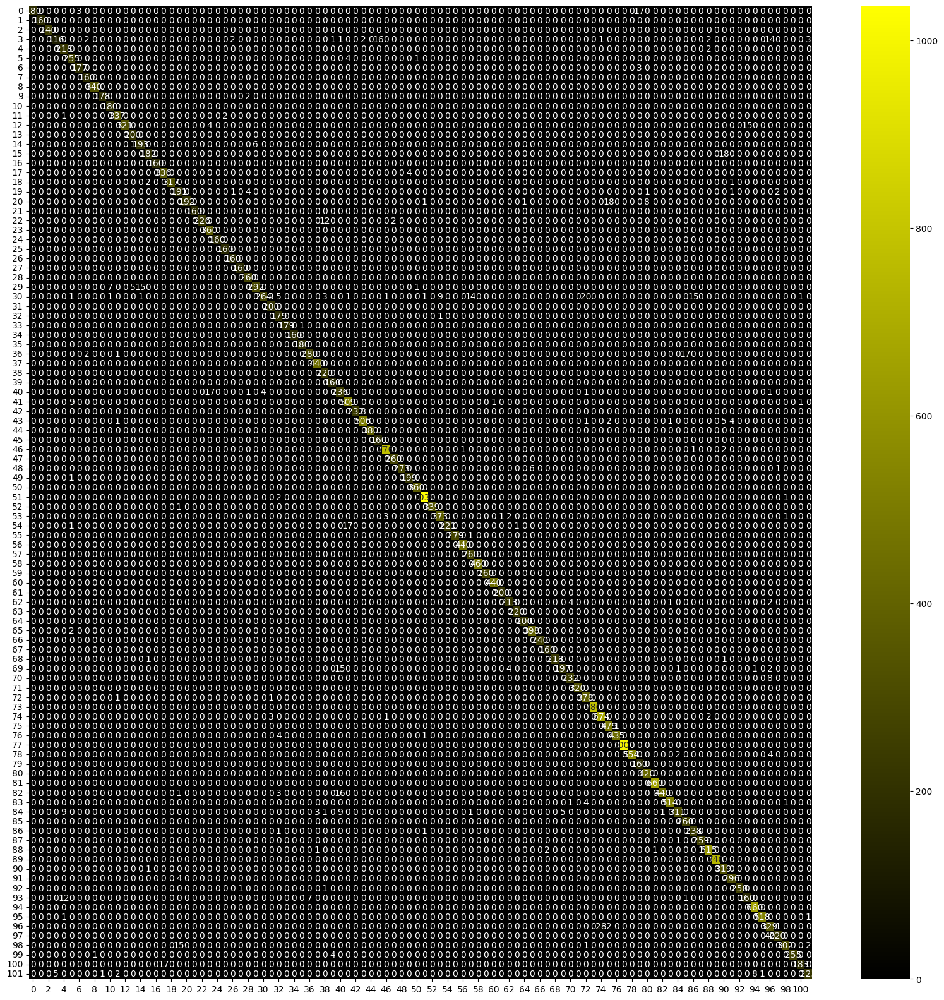

In [82]:
# Save Confusion Matrix as Dataframe (102 classes is a lot for .txt)
cm_df = pd.DataFrame(confusion_matrix(all_epochs_labels, all_epochs_preds))
cm_df.to_csv(CONF_MATRIX_CSV, index=False)

# Create a custom colormap for confusion matrix
from matplotlib.colors import LinearSegmentedColormap

colors = ["black", "yellow"]
cmap = LinearSegmentedColormap.from_list("custom", colors, N=256)

# Plot the heatmap using the custom colormap
plt.figure(figsize=(20,20))
sns.heatmap(confusion_matrix(all_epochs_labels, all_epochs_preds), annot=True, fmt='d', cmap=cmap)
plt.savefig(CONF_MATRIX_PNG)


# Write classification report to file
class_report = classification_report(all_epochs_labels, all_epochs_preds)

with open(VAL_REPORT_PATH, 'w') as f:
    f.write('Classification Report:\n')
    f.write(class_report)

time_elapsed = time.time() - start_time
print(f'Training completed in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
print(f'Best val Acc: {best_val_acc:4f}')

# Save all labels and corresponding predictions
lab_df = pd.DataFrame(all_epochs_labels, columns=['Label'])
pred_df = pd.DataFrame(all_epochs_preds, columns=['Pred'])
lab_df.to_csv(ALL_LABELS_PATH, index=False)
pred_df.to_csv(ALL_PREDS_PATH, index=False)

# Plot Loss and Accuracy metrics from Train and Validation Datasets

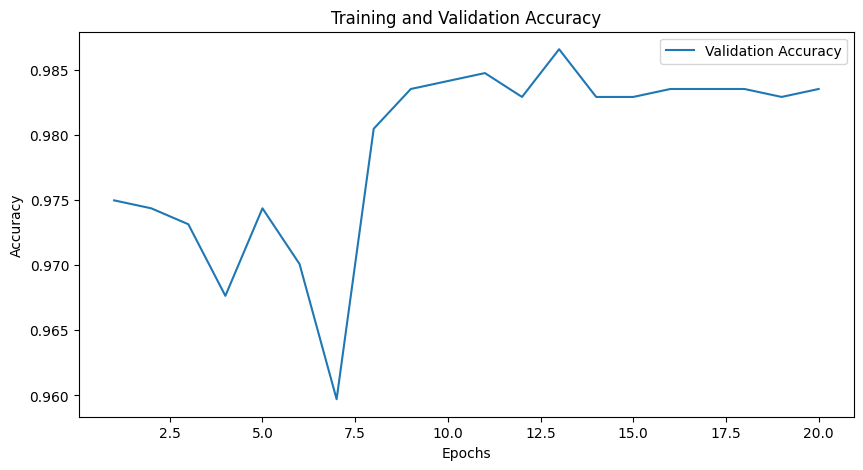

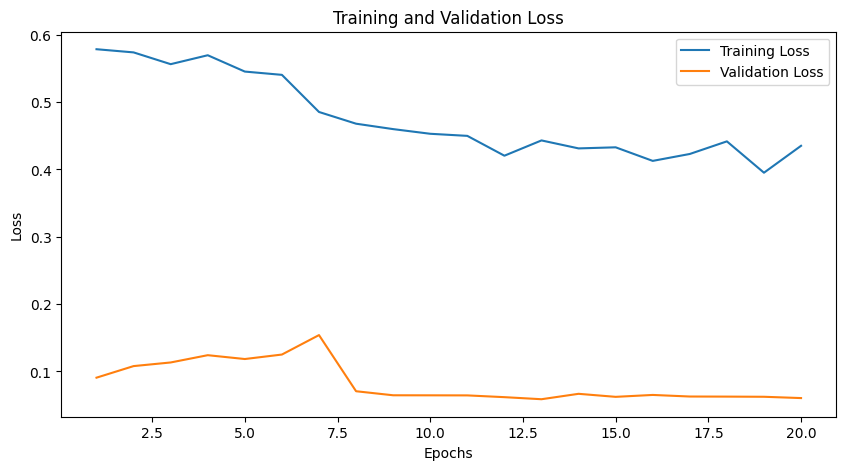

In [83]:
epochs = list(range(1, NUM_EPOCHS + 1))

val_accuracies_np = [elt.cpu().numpy() for elt in val_accuracies]

# Save training metrics to csv through pandas dataframe
metrics_df = pd.DataFrame({
    'train_losses': train_losses,
    'val_losses': val_losses,
    'val_accuracies': val_accuracies_np,
})


metrics_df.to_csv('losses_and_accuracies.csv', index=False)

# Plotting Accuracies
plt.figure(figsize=(10,5))
plt.plot(epochs, val_accuracies_np, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plotting Losses
plt.figure(figsize=(10,5))
plt.plot(epochs, train_losses, label='Training Loss')
plt.plot(epochs, val_losses, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# **Utils for model evaluation:**

In [84]:
# Read all_labels and all_preds lists from csv files

all_labels = []
all_preds = []

with open(ALL_LABELS_PATH, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        all_labels.append(float(row['Label']))

with open(ALL_PREDS_PATH, mode='r') as file:
    reader = csv.DictReader(file)
    for row in reader:
        all_preds.append(float(row['Pred']))

# print(all_labels)
# print(all_preds)

In [85]:
# Get Flowers Dataset labels' class names
ds_name = 'oxford_flowers102'
info = tfds.builder(ds_name).info

# print('Flower types full list:')
names = info.features['label'].names
names = [names[-1]] + names[:-1]
# print(names)

In [86]:
def plot_correct_preds(idx, true_label, df, names):
    '''
    Show a correctly classified image
    as well as another instance of a flower from its label.
    '''
    # Get the label's class name
    true_label_name = names[true_label]

    # Convert label 0 back to 102 (Had been since model prefered zero-indexing)
    if true_label == 0:
        true_label = 102

    # Retrieve the image path from the dataframe
    image_path = df.iloc[idx]['img_path']
    img = Image.open(image_path)

    plt.figure(figsize=(10, 5))

    # Plot the original image
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f'Correct prediction: {true_label_name} ({true_label})')
    plt.axis('off')

    # Plot a random image from the true label
    plt.subplot(1, 2, 2)
    true_label_rows = df[df['label'] == true_label].index.tolist()
    random_true_idx = random.choice([i for i in true_label_rows if i != idx])
    random_true_img_path = df.iloc[random_true_idx]['img_path']
    img_true = Image.open(random_true_img_path)
    plt.imshow(img_true)
    plt.title(f'Another from {true_label_name} ({true_label})')
    plt.axis('off')

    plt.tight_layout()
    plt.show()


In [87]:
def old_plot_wrong_preds(idx, true_label, pred_label, df, names):
    '''
    Show a misclassified image as well as instances each of a flower
    from the correct actual label and the wrong predicted label.
    '''

    # Get the true and predicted class names
    true_label_name = names[true_label]
    pred_label_name = names[pred_label]

    # Convert label 0 back to 102 (was 0 since model prefered zero-indexing)
    if true_label == 0:
        true_label = 102

    # Retrieve the image path from the dataframe
    image_path = df.iloc[idx]['img_path']
    img = Image.open(image_path)

    # Plot the original image
    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.imshow(img)
    plt.title(f'True: {true_label_name} ({true_label})\nWrong Predicted: {pred_label_name} ({pred_label})')
    plt.axis('off')

    # Plot a random image from the true label
    plt.subplot(1, 3, 2)
    true_label_rows = df[df['label'] == true_label].index.tolist()
    random_true_idx = random.choice([i for i in true_label_rows if i != idx])
    random_true_img_path = df.iloc[random_true_idx]['img_path']
    img_true = Image.open(random_true_img_path)
    plt.imshow(img_true)
    plt.title(f'Another from {true_label_name} ({true_label})')
    plt.axis('off')

    # Plot a random image from the predicted label
    plt.subplot(1, 3, 3)
    pred_label_rows = df[df['label'] == pred_label].index.tolist()
    if pred_label_rows:
        random_pred_idx = random.choice(pred_label_rows)
        random_pred_img_path = df.iloc[random_pred_idx]['img_path']
        img_pred = Image.open(random_pred_img_path)
        plt.imshow(img_pred)
        plt.title(f'Another from {pred_label_name} ({pred_label})')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [88]:
def plot_wrong_preds(idx, true_label, pred_label, df, names):
    '''
    Show a misclassified image as well as 3 instances each of a flower
    from the correct actual label and the wrong predicted label.
    '''

    # Get the true and predicted class names
    true_label_name = names[true_label]
    pred_label_name = names[pred_label]

    # Convert label 0 back to 102 (was 0 since model prefered zero-indexing)
    if true_label == 0:
        true_label = 102

    # Retrieve the image path from the dataframe
    image_path = df.iloc[idx]['img_path']
    img = Image.open(image_path)

    # Plot the original image
    plt.figure(figsize=(20, 5))
    plt.subplot(3, 4, 1)
    plt.imshow(img)
    plt.title(f'True Label: {true_label_name} ({true_label})\nWrong Predicted Label: {pred_label_name} ({pred_label})')
    plt.axis('off')

    def four_other_imgs(label):
        '''
        Returns 4 other opened images from the input label in an iterator
        '''
        label_rows = df[df['label'] == label].index.tolist()
        random_indices = random.sample([i for i in label_rows if i != idx], 4)

        img_paths = [df.iloc[index]['img_path'] for index in random_indices]
        imgs = [Image.open(path) for path in img_paths]

        return imgs

    # Plot four random images from the true actual label
    true_images = four_other_imgs(true_label)

    for i, image in enumerate(true_images):
        plt.subplot(3, 4, i + 5)
        plt.imshow(image)
        plt.title(f'Another from {true_label_name} ({true_label})')
        plt.axis('off')

    # Plot four random images from the wrong predicted label
    wrong_images = four_other_imgs(pred_label)

    for i, image in enumerate(wrong_images):
        plt.subplot(3, 4, i + 9)
        plt.imshow(image)
        plt.title(f'Another from {pred_label_name} ({pred_label})')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


In [89]:
# Get indices of val data from original df since train-test-split messed up the indices
original_indices = []
for i, (inputs, labels) in enumerate(val_loader):
    batch_start_idx = i * BATCH_SIZE
    batch_end_idx = (i + 1) * BATCH_SIZE
    batch_original_indices = val_df.iloc[batch_start_idx:batch_end_idx].index.tolist()
    original_indices.extend(batch_original_indices)

# **Model Evaluation:**

See classification report (saved under `VAL_REPORT_PATH`) for precision, recall, f1 score, support metrics.

This model had a validation accuracy of 99% and an f1 score of 99%. 16 misclassified images out of 1638-image validation dataset, which was split such that class ratios reflected the overall dataset splits.

Both training and validation losses decreased rapidly, reaching close to zero, suggesting the model avoided overfitting and is generalizing well to unseen data, though there is definitely still room for improvement.

# **Ways to Improve**

Plot all misclassified images as well as an instance each of a flower
from the correct label and the wrong predicted label.

Comment out `else` condition to also plot correctly classified images
and another instance from that same label.

- Looking at the labels that were misclassified, the vast majority of the true and predicted labels are from classes whose size is in the 2nd and 3rd quartile of all class sizes. Hence we don't need to worry too much that class imbalance is the cause for these misclassified images.

- From the plots we can see that the wrongly predicted images are often similar in color to images from the predicted label. The model seems to be over-reliant on color for classification. This may be remedied through data augmentation methods such as Grayscale or Color Jitter which removes color or alteres brightness, contrast, etc.

- While I only augmented images in place, in the future I can multiply my dataset by adding augmented training data with methods aforementioned, and possibly oversampling classes with fewer images.

- Finally, a grid search may have been applied to find the optimal learning rate, augmentation parameters, scheduler parameters, etc.

In [90]:
print(len(val_loader), #batches of data
      len(all_labels), len(all_preds), len(original_indices), len(val_df))

205 32760 32760 1638 1638


1638

Wrong classification 1 for image 4564


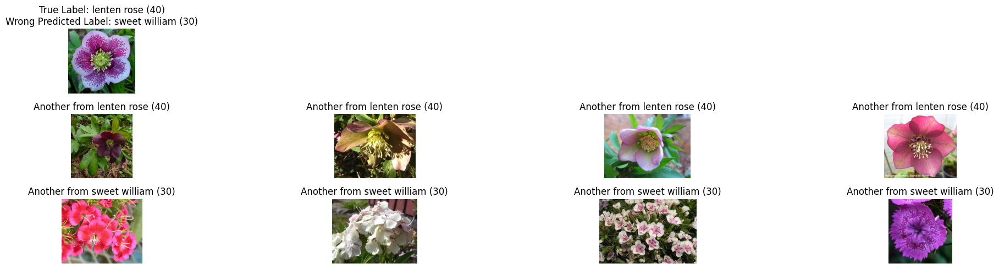


Wrong classification 2 for image 4012


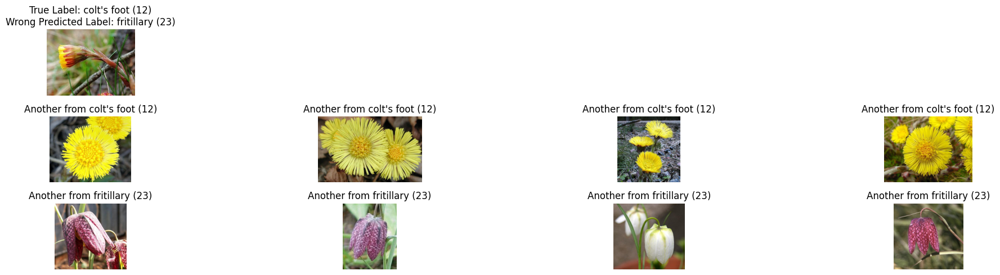


Wrong classification 3 for image 3492


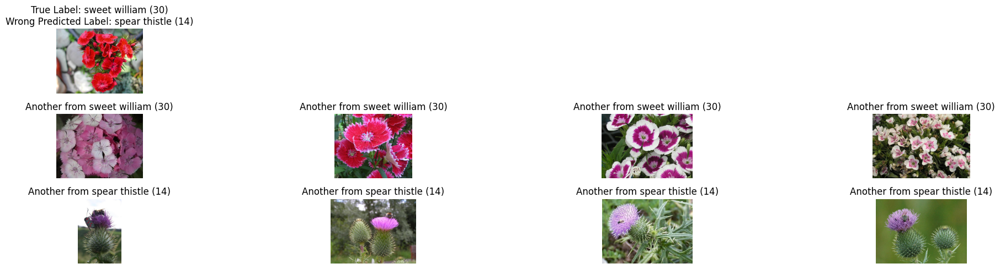


Wrong classification 4 for image 2350


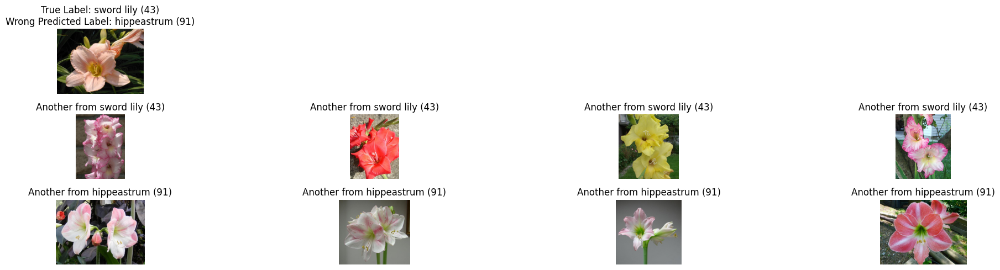


Wrong classification 5 for image 7773


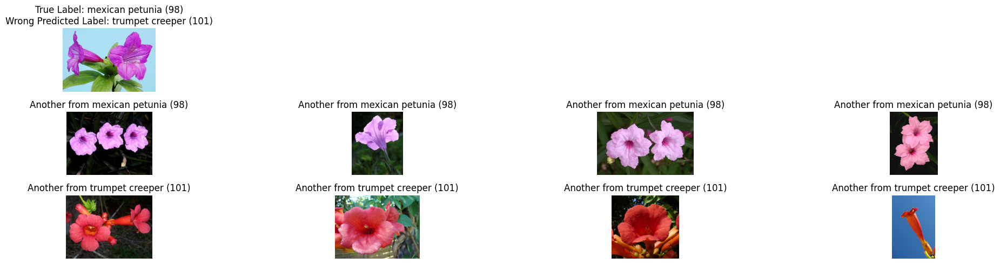


Wrong classification 6 for image 4938


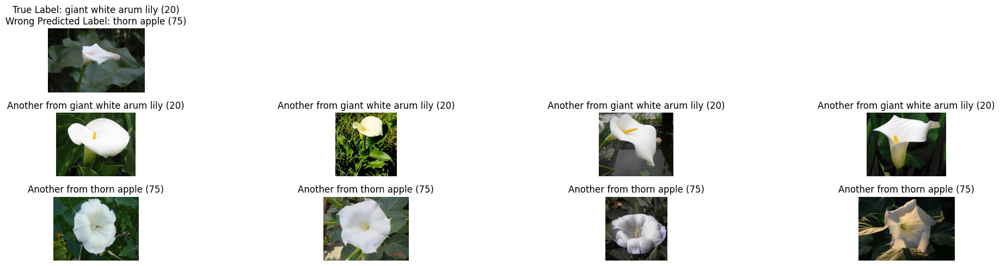


Wrong classification 7 for image 3460


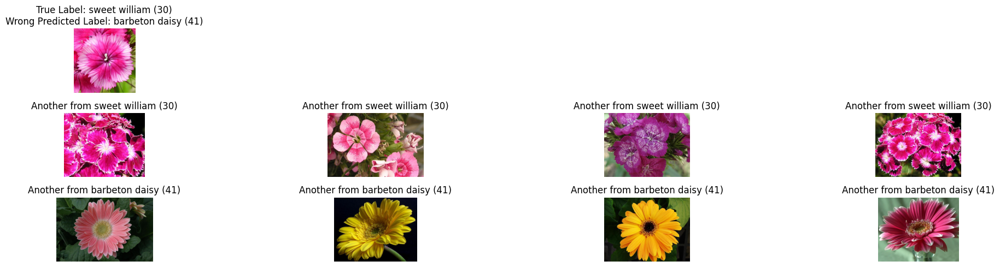


Wrong classification 8 for image 7942


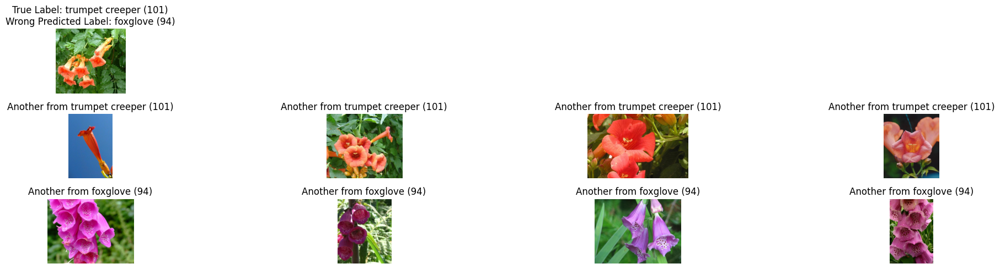


Wrong classification 9 for image 5159


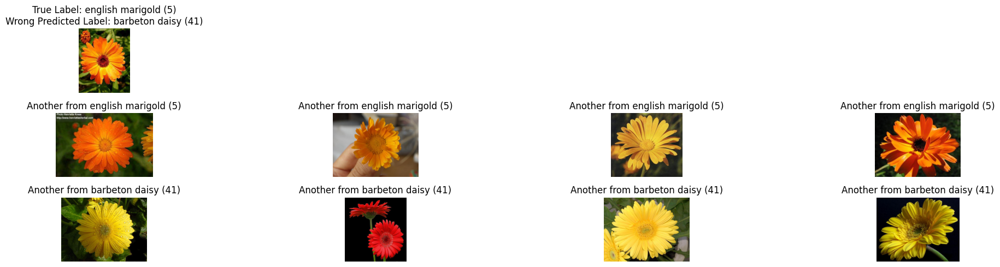


Wrong classification 10 for image 8189


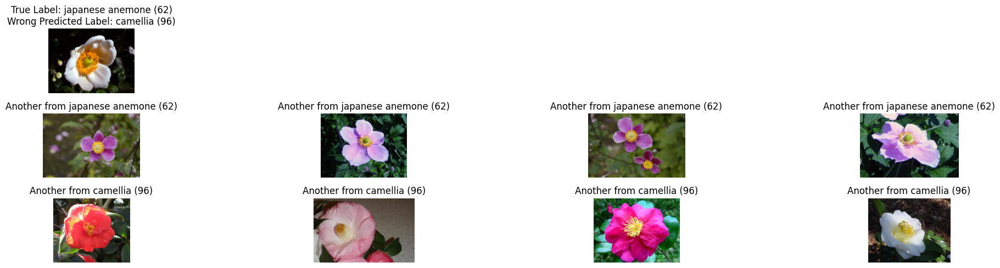


Wrong classification 11 for image 1807


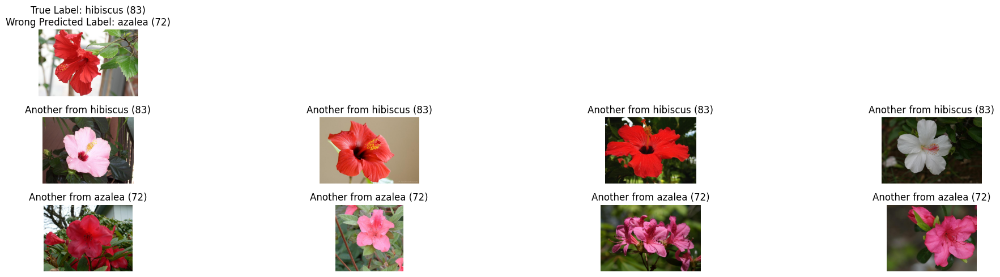


Wrong classification 12 for image 4265


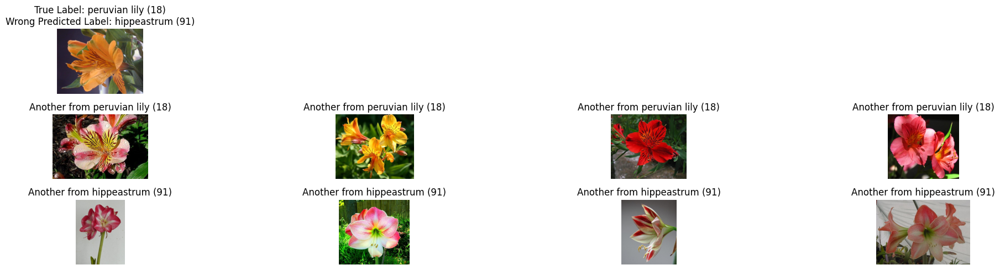


Wrong classification 13 for image 4086


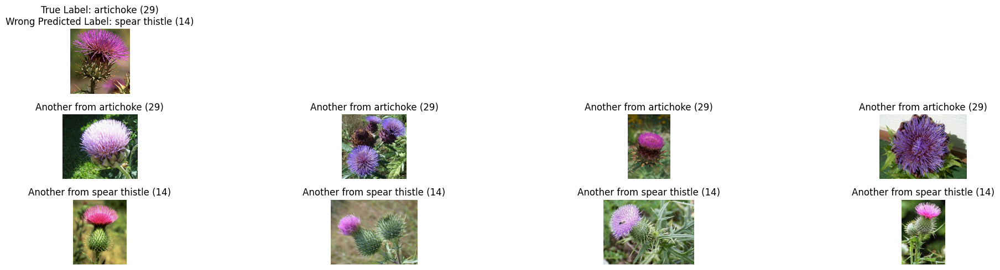


Wrong classification 14 for image 7870


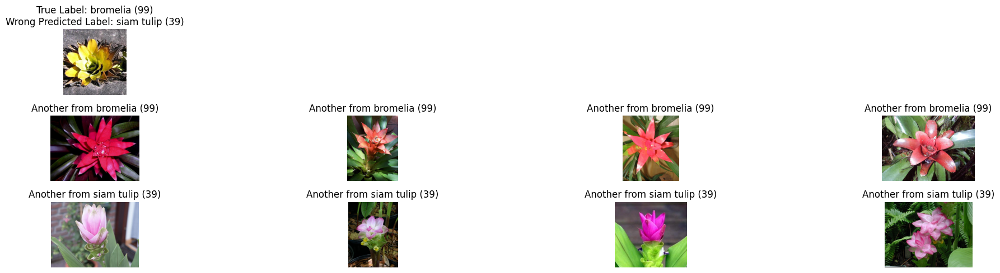


Wrong classification 15 for image 6623


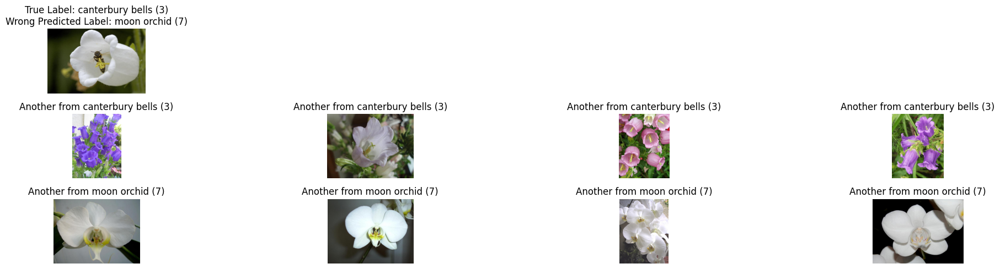


Wrong classification 16 for image 6361


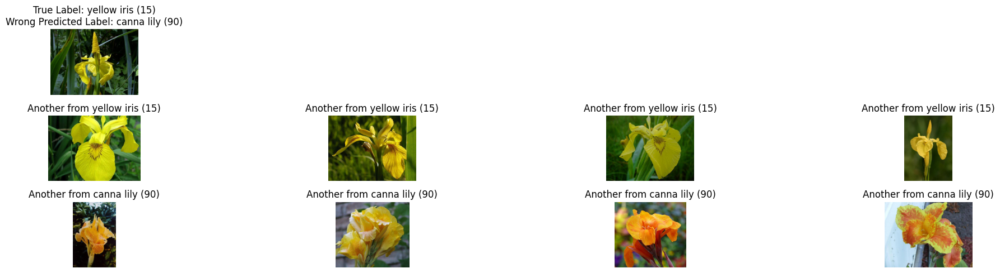


Wrong classification 17 for image 4358


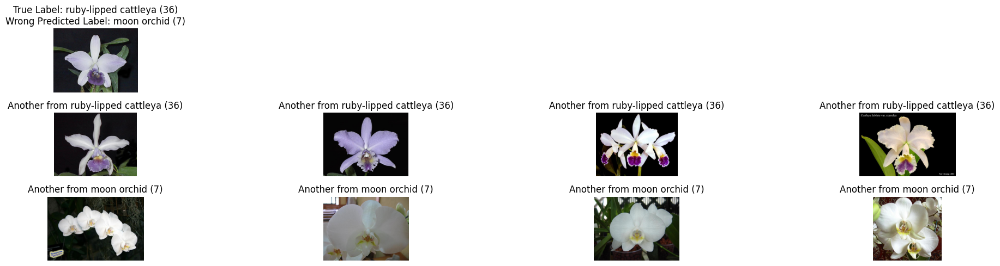


Wrong classification 18 for image 4248


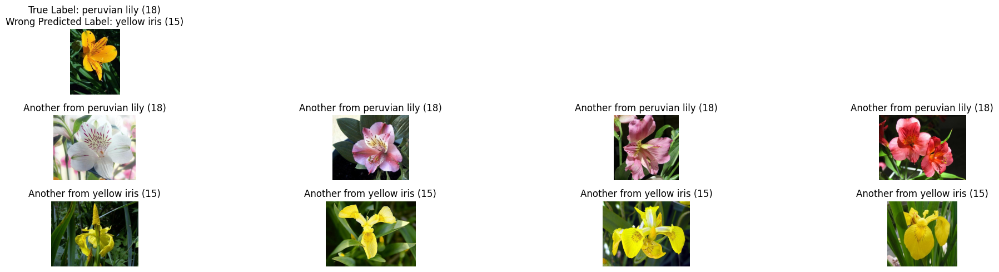


Wrong classification 19 for image 2458


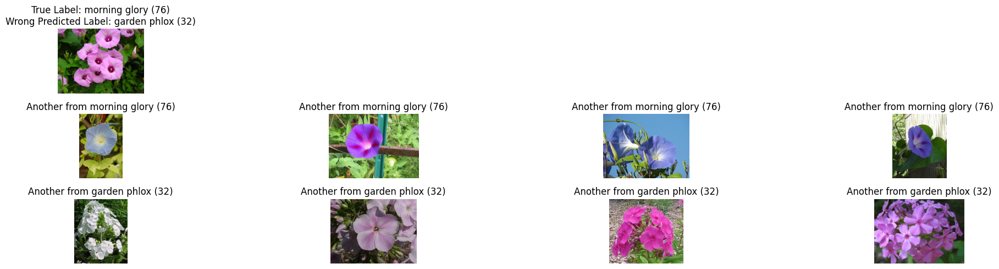


Wrong classification 20 for image 6045


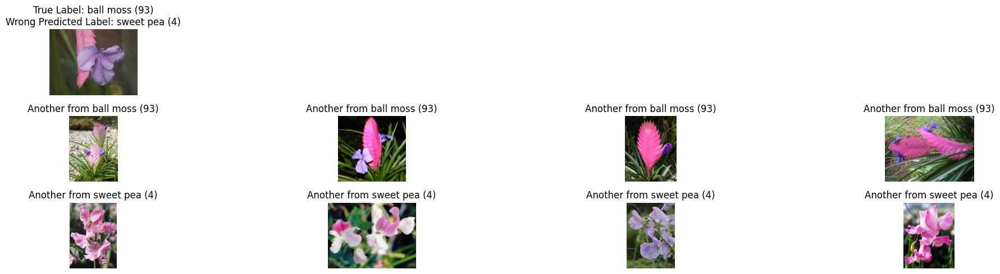


Wrong classification 21 for image 4829


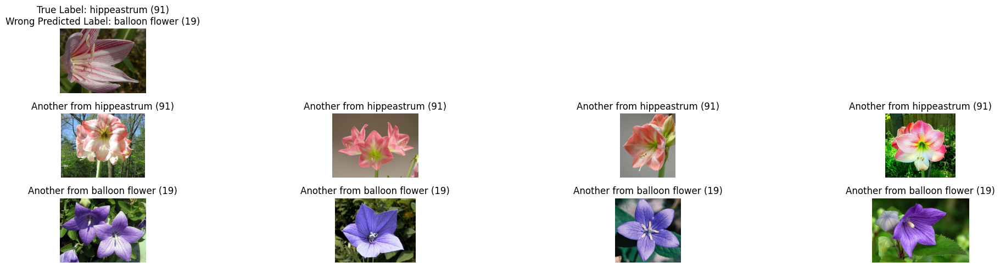


Wrong classification 22 for image 3465


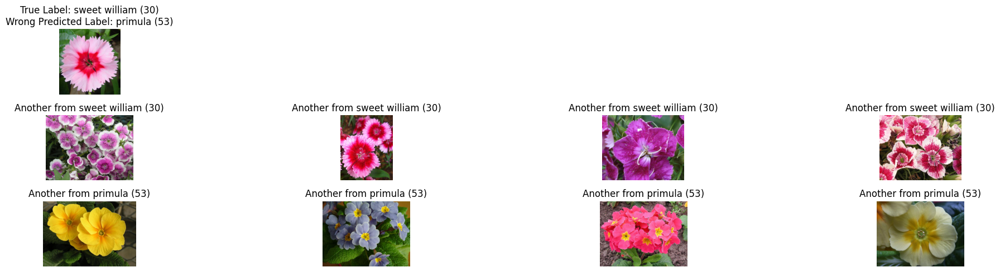


Wrong classification 23 for image 5173


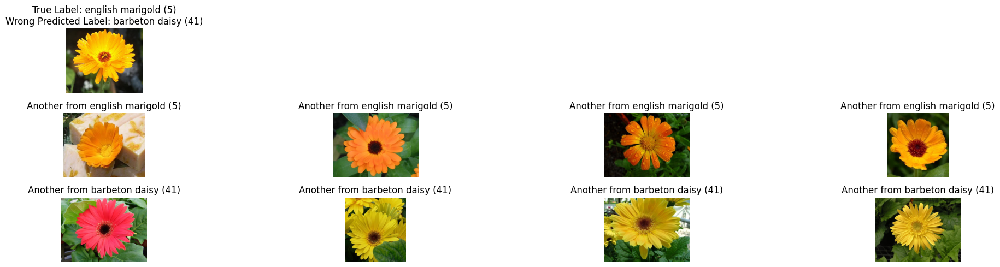


Wrong classification 24 for image 3652


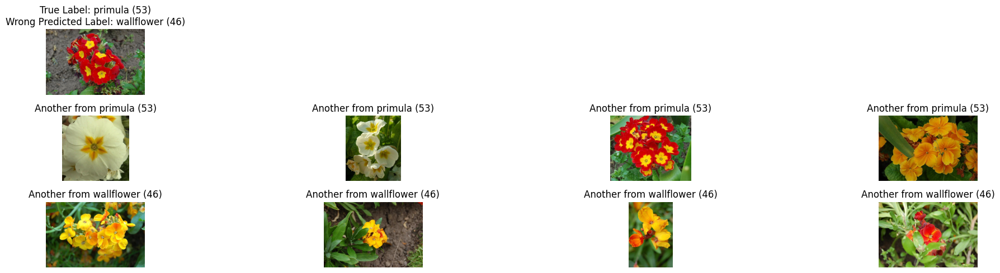


Wrong classification 25 for image 7600


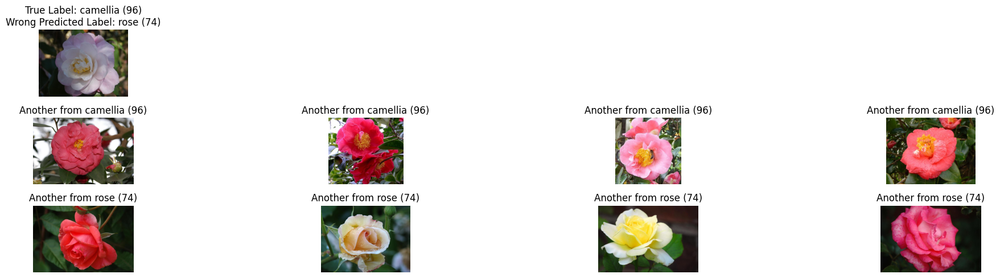


Wrong classification 26 for image 1744


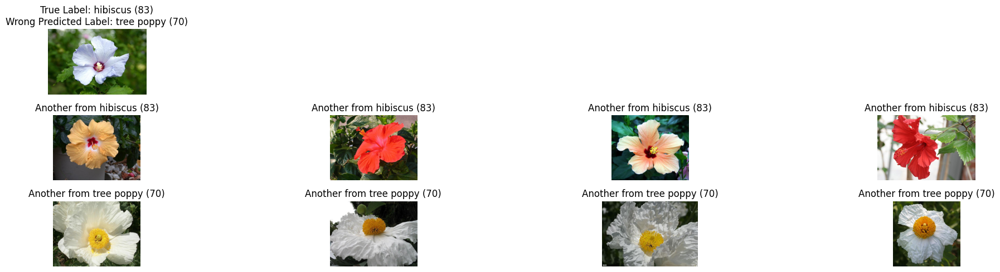


Wrong classification 27 for image 6004


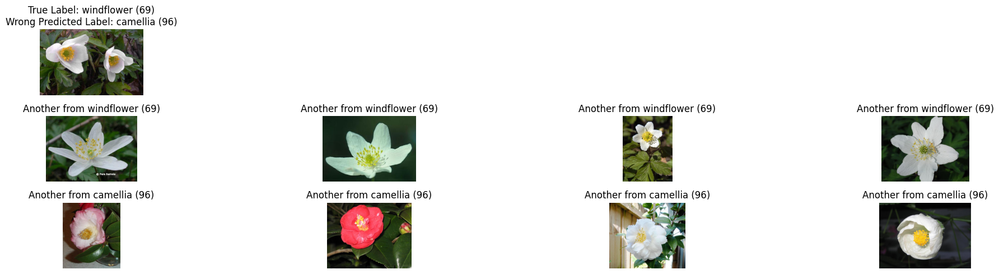


Wrong classification 28 for image 3468


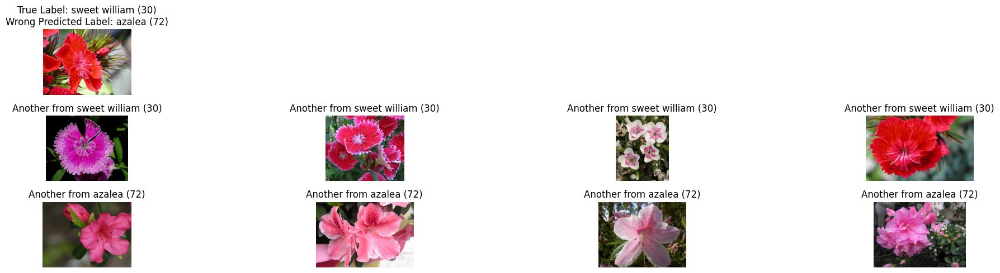


Wrong classification 29 for image 1960


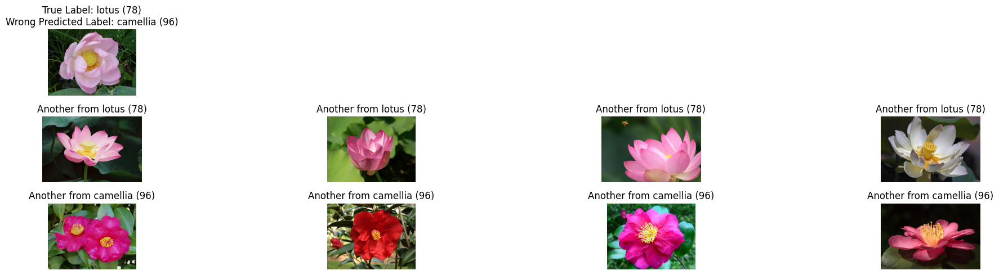


Wrong classification 30 for image 8025


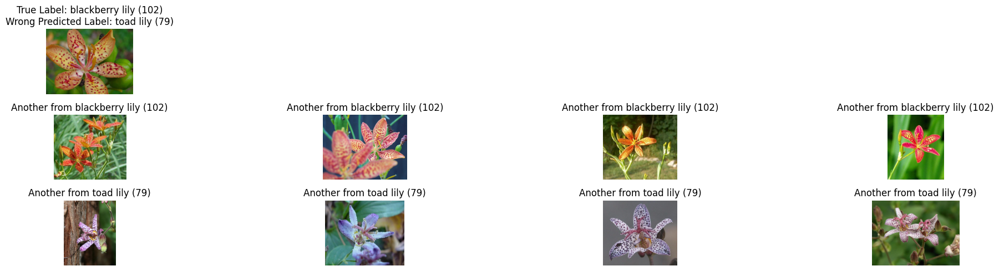


Wrong classification 31 for image 5483


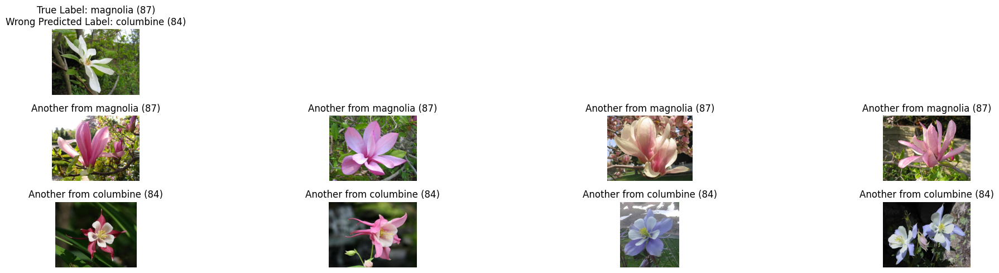


Wrong classification 32 for image 2590


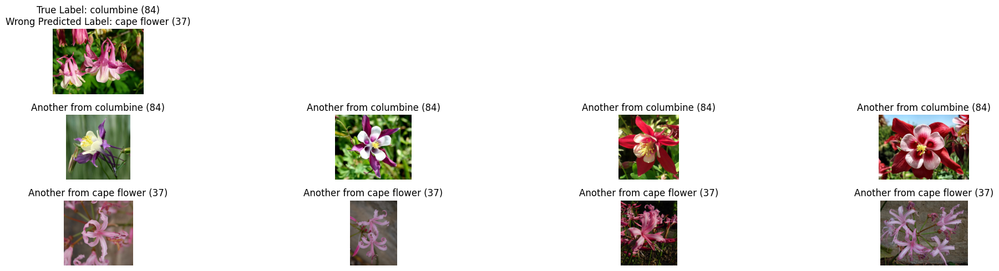


Wrong classification 33 for image 8153


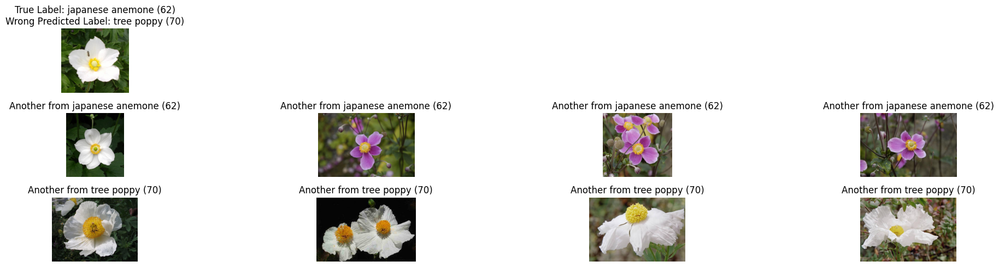


Wrong classification 34 for image 2615


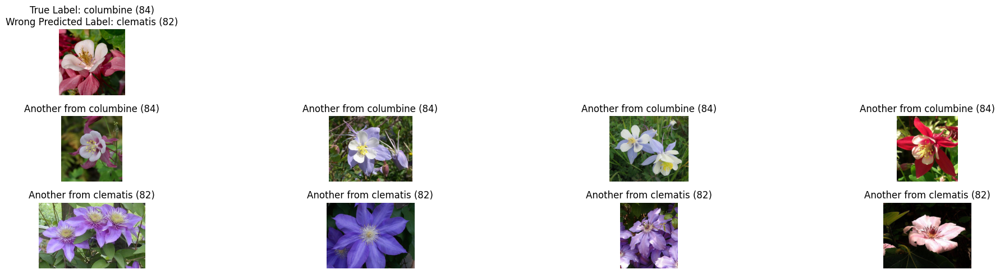


Wrong classification 35 for image 7199


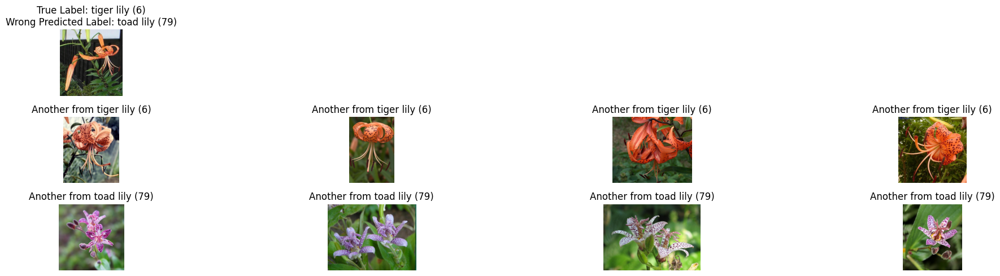


Wrong classification 36 for image 1593


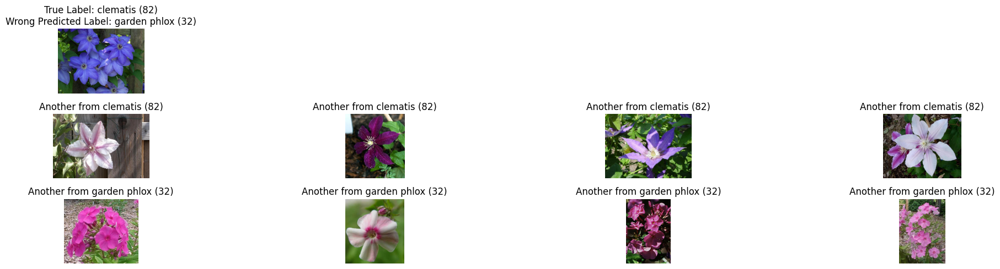


Wrong classification 37 for image 3470


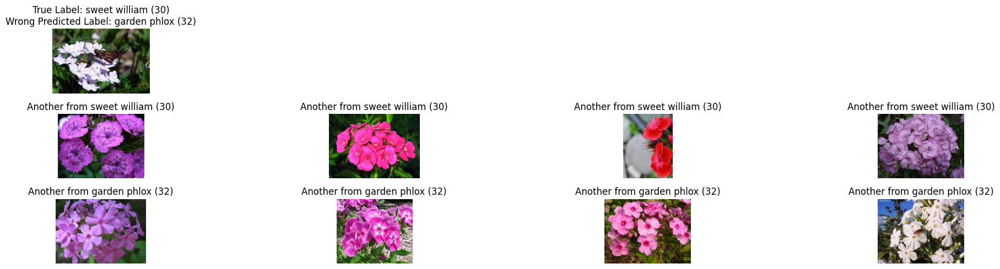


Wrong classification 38 for image 972


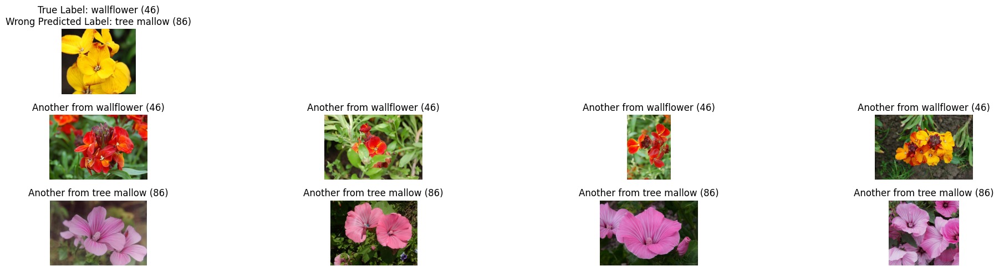


Wrong classification 39 for image 6473


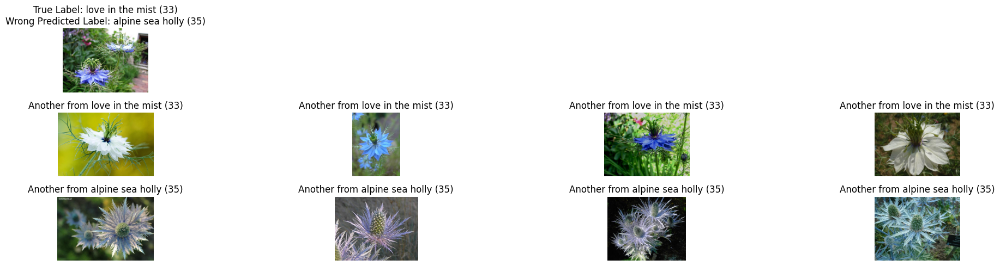


Wrong classification 40 for image 6620


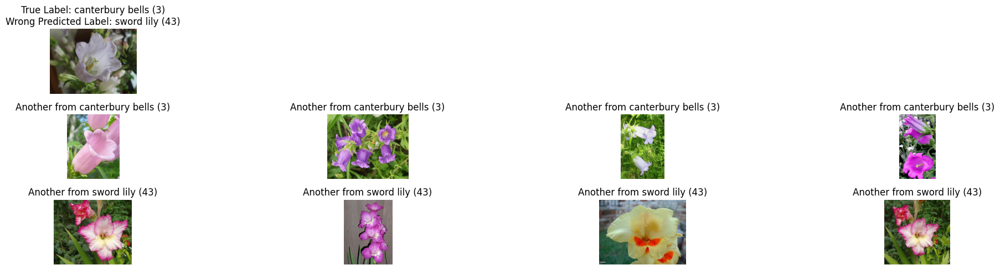


Wrong classification 41 for image 6165


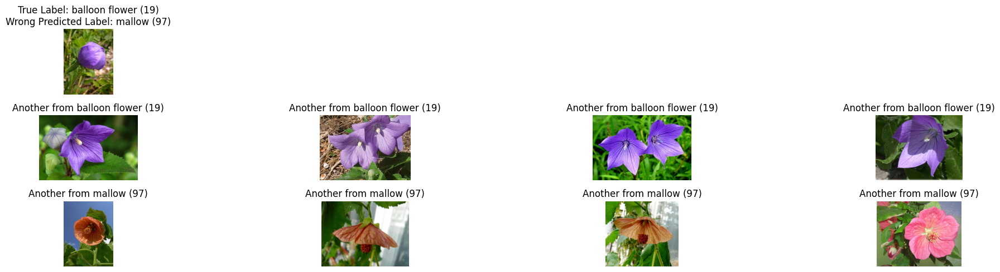

In [91]:
i = 1
print(len(original_indices))
for idx, (true_label, pred_label) in enumerate(zip(all_labels, all_preds)):
    # Get the corresponding index in the original DataFrame df
    try:
        # if idx is not in val dataset, skip over
        og_idx = original_indices[idx]

        # Convert float values of labels back to integers
        pred_label = int(pred_label)
        true_label = int(true_label)

        if true_label != pred_label:
            print(f'\nWrong classification {i} for image', og_idx + 1)
            plot_wrong_preds(og_idx, true_label, pred_label, df, names)
            i += 1
    except:
        continue




    # else:
    #     print('\nTrue!')
    #     plot_correct_preds(og_idx, true_label, df, names)